<h1>HW5 - Generative Adversarial Networks (GANs)</h1>
<h3><font color=yellow>Total Points: 100</font></h3>



<font color=greeen>Please, name this file as HW5_Q7_{Student_ID}.ipynb</font>

<h2>Full Name: Mahdi Salahshour </h2>
<h2>Student ID: 99101727 </h2>

# Init

In [1]:
import os
import numpy as np
import matplotlib.pyplot as plt
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.autograd import Variable
from torchvision import datasets, transforms

In [2]:
# Data Preprocessing
transform = transforms.Compose([
    transforms.Resize(64),
    transforms.ToTensor(),
    transforms.Normalize([0.5], [0.5])
])

# DataLoader
mnist_dataset = datasets.MNIST(root='./MNIST', train=True, transform=transform, download=True);
data_loader = torch.utils.data.DataLoader(dataset=mnist_dataset, batch_size=32, shuffle=True, num_workers=2);

100%|██████████| 9912422/9912422 [00:00<00:00, 72413638.52it/s]


Extracting ./MNIST/MNIST/raw/train-images-idx3-ubyte.gz to ./MNIST/MNIST/raw



100%|██████████| 28881/28881 [00:00<00:00, 112684366.35it/s]

Extracting ./MNIST/MNIST/raw/train-labels-idx1-ubyte.gz to ./MNIST/MNIST/raw




100%|██████████| 1648877/1648877 [00:00<00:00, 31586335.80it/s]


Extracting ./MNIST/MNIST/raw/t10k-images-idx3-ubyte.gz to ./MNIST/MNIST/raw



100%|██████████| 4542/4542 [00:00<00:00, 19639720.38it/s]

Extracting ./MNIST/MNIST/raw/t10k-labels-idx1-ubyte.gz to ./MNIST/MNIST/raw



# Part 1: Implementation of a Basic GAN

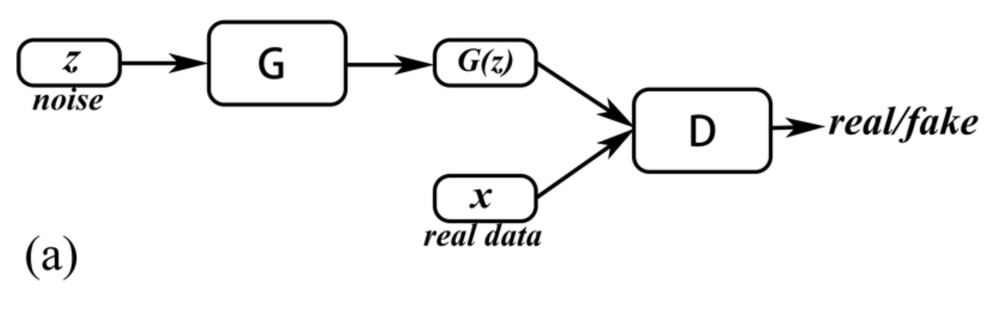

In this section, we will implement a basic Generative Adversarial Network (GAN) to generate fake images of handwritten digits using the MNIST dataset. The main components of this GAN include:

1. **Data Preprocessing**: Loading the MNIST dataset and applying necessary transformations.
2. **Generator**: A neural network that takes random noise as input and generates an image.
3. **Discriminator**: A neural network that takes an image as input and classifies it as real or fake.
4. **Training Loop**: Training the generator and discriminator in alternating steps.
5. **Results**: Visualizing the generated images and logging the training process.

Your task is to follow along with the provided code, understand the underlying concepts, and fill in any missing parts as instructed. Pay close attention to the network architectures, loss functions, and training dynamics to grasp how GANs function.


In [ ]:
class Generator(nn.Module):
    def __init__(self, z_dim=100):
        super(Generator, self).__init__()

        self.main = nn.Sequential(
        # Hint: Use ConvTranspose2d, BatchNorm2d and proper activation
            nn.ConvTranspose2d(z_dim, 512, kernel_size=4, stride=1, padding=0, bias=False),
            nn.BatchNorm2d(512),
            nn.ReLU(True),
            nn.ConvTranspose2d(512, 256, kernel_size=4, stride=2, padding=1, bias=False),
            nn.BatchNorm2d(256),
            nn.ReLU(True),
            nn.ConvTranspose2d(256, 128, kernel_size=4, stride=2, padding=1, bias=False),
            nn.BatchNorm2d(128),
            nn.ReLU(True),
            nn.ConvTranspose2d(128, 64, kernel_size=4, stride=2, padding=1, bias=False),
            nn.BatchNorm2d(64),
            nn.ReLU(True),
            nn.ConvTranspose2d(64, 1, kernel_size=4, stride=2, padding=1, bias=False),
            nn.Tanh()
            )


    def forward(self, z):
        z = z.view(z.size(0), z.size(1), 1, 1)
        return self.main(z)

In [ ]:
class Discriminator(nn.Module):
    def __init__(self):
        super(Discriminator, self).__init__()
        self.main = nn.Sequential(
            # Hint: Use Conv2d, BatchNorm2d and proper activation layers
            nn.Conv2d(1, 64, kernel_size=4, stride=2, padding=1, bias=False),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(64, 128, kernel_size=4, stride=2, padding=1, bias=False),
            nn.BatchNorm2d(128),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(128, 256, kernel_size=4, stride=2, padding=1, bias=False),
            nn.BatchNorm2d(256),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(256, 512, kernel_size=4, stride=2, padding=1, bias=False),
            nn.BatchNorm2d(512),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(512, 1, kernel_size=4, stride=1, padding=0, bias=False),
            nn.Sigmoid()
        )

    def forward(self, image):
        return self.main(image).view(-1, 1)

In [ ]:
def save_fake_images(epoch, generator, fixed_z, batch_size, z_dim):
    sample_path = 'gan'
    if not os.path.exists(sample_path):
        os.makedirs(sample_path)

    fake_images = generator(fixed_z).view(batch_size, 1, 64, 64)
    plt.figure(figsize=(16, 4))
    for i in range(8):
        img = fake_images[i].cpu().detach().squeeze().numpy()
        img = (img + 1) / 2
        img = np.clip(img, 0, 1)

        plt.subplot(1, 8, i+1)
        plt.imshow(img, cmap='gray')
        plt.axis('off')

    plt.show()

In [ ]:
def train_discriminator(discriminator, images, real_labels, fake_image, fake_labels, criterion, optimizer):

    # Hint: Pass real and fake images to discriminator and backporpagate sum of real and fake losses
    # Real Images
    real_outputs = discriminator(images)
    loss_real = criterion(real_outputs, real_labels)
    fake_outputs = discriminator(fake_image.detach())
    loss_fake = criterion(fake_outputs, fake_labels)
    d_loss = loss_real + loss_fake
    optimizer.zero_grad()
    d_loss.backward()
    optimizer.step()

    return d_loss.item()


def train_generator(discriminator, fake_image, real_labels, criterion, optimizer):
    # Hint: Use discriminator to evaluate fake_image and calculate and backpropagate the generator loss (g_loss)
    prob_fake = discriminator(fake_image)
    g_loss = criterion(prob_fake, real_labels)

    # Backpropagation and optimization
    optimizer.zero_grad()
    g_loss.backward()
    optimizer.step()

    return g_loss.item()

Epoch 1, Step 1871, D Loss: 0.0441, G Loss: 5.3247

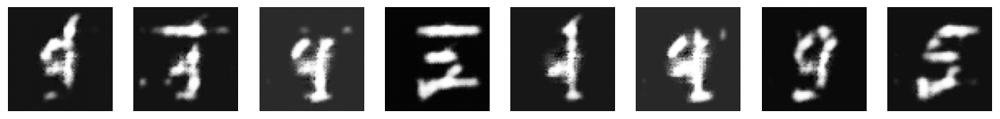

Epoch 2, Step 1871, D Loss: 0.1330, G Loss: 3.0660

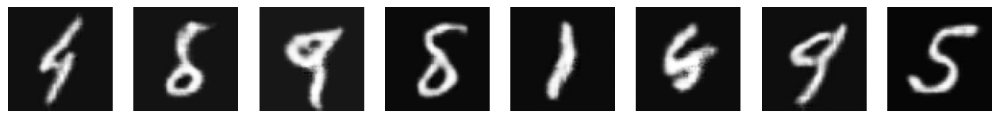

Epoch 3, Step 1871, D Loss: 0.3775, G Loss: 4.1491

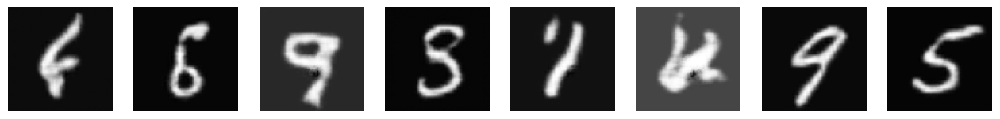

Epoch 4, Step 1871, D Loss: 1.1903, G Loss: 1.5963

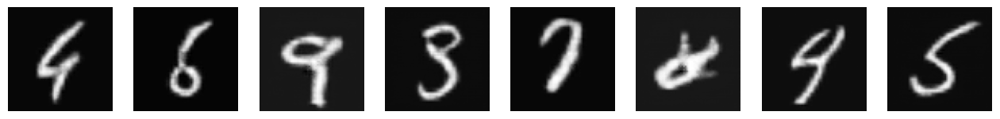

Epoch 5, Step 1871, D Loss: 0.0408, G Loss: 4.4752

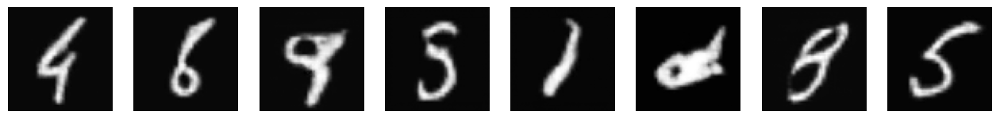

Epoch 6, Step 1871, D Loss: 0.1219, G Loss: 2.0240

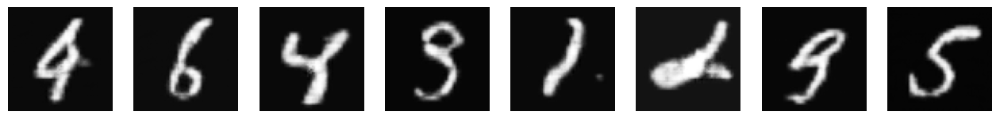

Epoch 7, Step 1871, D Loss: 0.0681, G Loss: 10.6394

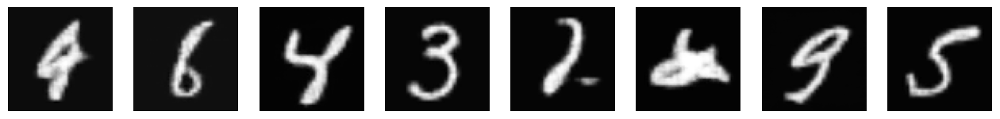

Epoch 8, Step 1871, D Loss: 0.0186, G Loss: 7.1150

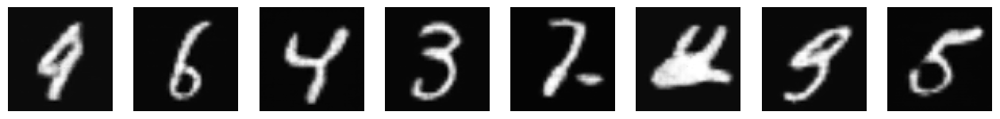

Epoch 9, Step 1871, D Loss: 0.0010, G Loss: 16.0929

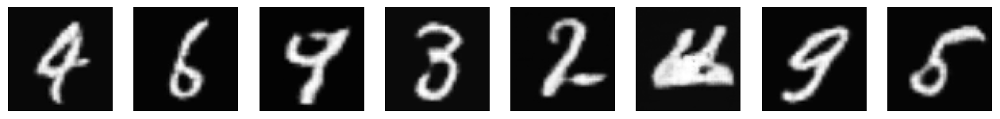

Epoch 10, Step 1871, D Loss: 0.0001, G Loss: 7.6135

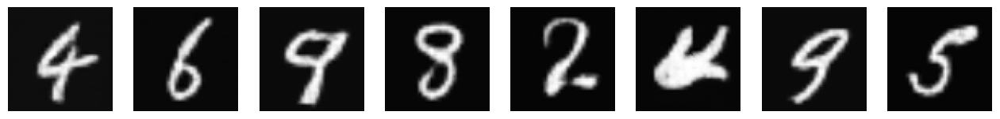

Epoch 11, Step 1871, D Loss: 0.0018, G Loss: 9.0471

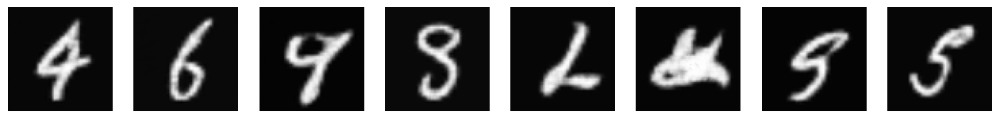

Epoch 12, Step 1871, D Loss: 0.0023, G Loss: 13.6486

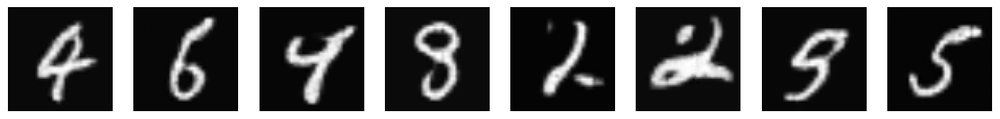

Epoch 13, Step 1871, D Loss: 0.0095, G Loss: 9.1527

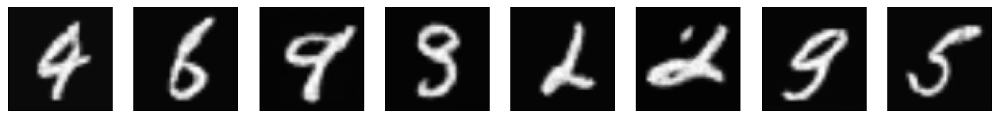

Epoch 14, Step 1871, D Loss: 0.0021, G Loss: 9.3832

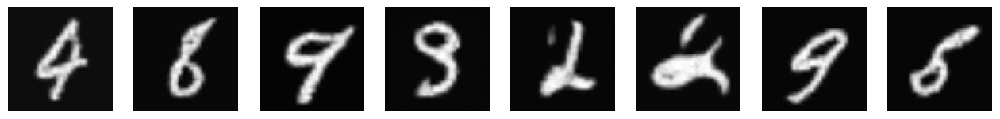

Epoch 15, Step 1871, D Loss: 0.0077, G Loss: 5.9587

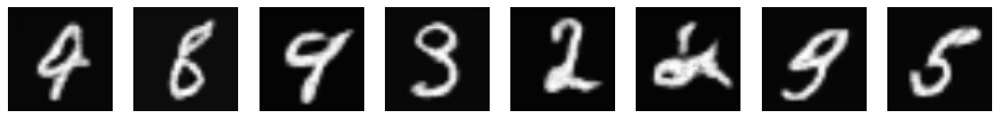

Epoch 16, Step 1871, D Loss: 0.0764, G Loss: 2.9799

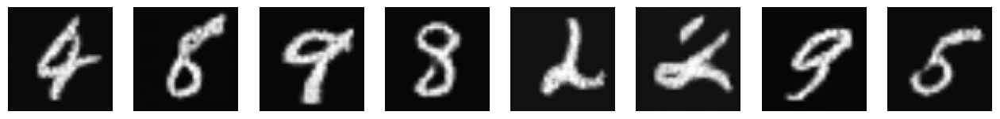

Epoch 17, Step 1871, D Loss: 0.0000, G Loss: 10.8784

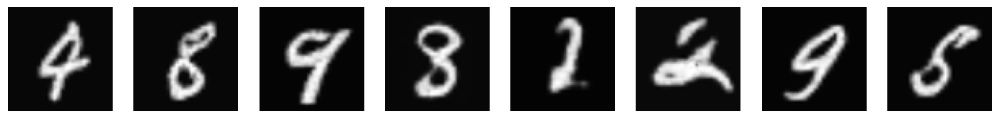

Epoch 18, Step 1871, D Loss: 0.0030, G Loss: 11.4256

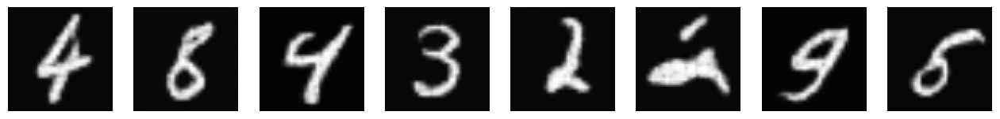

Epoch 19, Step 1871, D Loss: 0.1390, G Loss: 6.5699

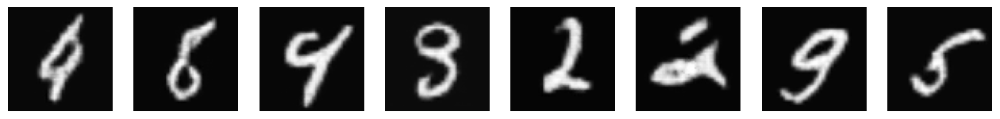

Epoch 20, Step 1871, D Loss: 0.0000, G Loss: 12.0519

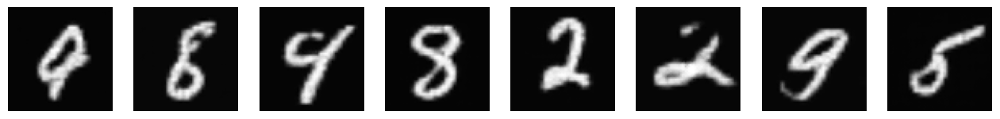

In [ ]:
num_epochs = 20
batch_size = 32
z_dim = 100
criterion = nn.BCELoss()

generator = Generator().cuda()
discriminator = Discriminator().cuda()

# Define optimizer
d_optimizer = torch.optim.Adam(discriminator.parameters(),lr=0.0002)
g_optimizer = torch.optim.Adam(generator.parameters(),lr=0.0002)

# To generate a few images after each epoch
fixed_z = Variable(torch.randn(batch_size, z_dim)).cuda()

for epoch in range(num_epochs):
    for i, (images, _) in enumerate(data_loader):
        images = images.cuda()
        z = Variable(torch.randn(batch_size, z_dim)).cuda()
        real_labels = torch.ones(batch_size, 1).cuda()
        fake_labels = torch.zeros(batch_size, 1).cuda()

        # Train Discriminator
        fake_image = generator(z)
        d_loss = train_discriminator(discriminator, images, real_labels, fake_image, fake_labels, criterion, d_optimizer)

        # Train Generator
        z = Variable(torch.randn(batch_size, z_dim)).cuda()
        fake_image = generator(z)
        g_loss = train_generator(discriminator, fake_image, real_labels, criterion, g_optimizer)

        if i % 10 == 0:
            print(f'\rEpoch {epoch+1}, Step {i+1}, D Loss: {d_loss:.4f}, G Loss: {g_loss:.4f}',end='')

    # Generate and save a few fake images
    save_fake_images(epoch+1, generator, fixed_z, batch_size, z_dim)

<br><br><br><br><br><br><br><br>

# Part 2: Implementation of a Conditional GAN (CGAN)

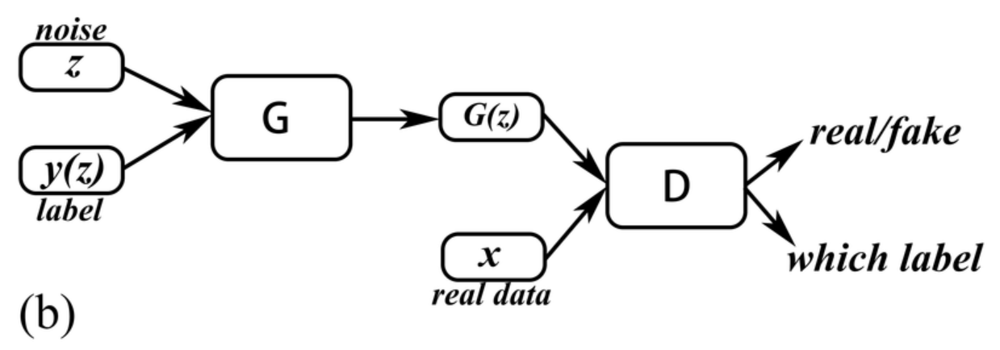

In this section, we will implement a Conditional Generative Adversarial Network (CGAN) to generate fake images of handwritten digits, conditioned on their labels, using the MNIST dataset. This means that we can generate images of specific digits by providing the desired digit label as input to the generator.

The main components of this CGAN include:

1. **Data Preprocessing**: Loading the MNIST dataset with labels and applying necessary transformations.
2. **Generator**: A neural network that takes random noise and a digit label as input and generates an image.
3. **Discriminator**: A neural network that takes an image and a digit label as input and classifies it as real or fake.
4. **Training Loop**: Training the generator and discriminator in alternating steps, taking the digit labels into account.
5. **Results**: Visualizing the generated images conditioned on labels and logging the training process.


In [33]:
class ConditionalGenerator(nn.Module):
    def __init__(self, z_dim=100, label_dim=10):
        super(ConditionalGenerator, self).__init__()
        self.label_embedding = nn.Embedding(label_dim, label_dim).cuda()
        self.model = nn.Sequential(
            nn.Linear(z_dim + label_dim, 256),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Linear(256, 512),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Linear(512, 1024),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Linear(1024, 1*64*64),
            nn.Tanh()

        )

    def forward(self, noise, labels):
        labels = self.label_embedding(labels)
        labels = labels.view(labels.size(0), -1)
        gen_input = torch.cat((noise, labels), 1)  # Concatenate along the feature dimension
        img = self.model(gen_input)
        img = img.view(img.size(0), 1, 64, 64)
        return img

In [34]:
class ConditionalDiscriminator(nn.Module):
    def __init__(self, label_dim=10):
        super(ConditionalDiscriminator, self).__init__()
        self.label_embedding = nn.Embedding(label_dim, label_dim).cuda()
        self.model = nn.Sequential(
            # Hint: Use Linear, BatchNorm1d and proper activation layers
            # Hint: You may need use Dropout layers
            nn.Linear(1*64*64+label_dim, 1024),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Dropout(0.3),
            nn.Linear(1024, 512),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Dropout(0.3),
            nn.Linear(512, 256),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Dropout(0.3),
            nn.Linear(256, 1),
            nn.Sigmoid()

        )

    def forward(self, img, labels):
        # Concatenate label embedding and image to produce input
        d_in = torch.cat((img.view(img.size(0), -1), self.label_embedding(labels)), -1).cuda()
        validity = self.model(d_in)
        return validity

In [35]:
# Initialize generator and discriminator
generator = ConditionalGenerator().cuda()
discriminator = ConditionalDiscriminator().cuda()

# Loss functions
adversarial_loss = torch.nn.BCELoss()

# Optimizers
optimizer_G = torch.optim.Adam(generator.parameters(), lr=0.0002, betas=(0.5, 0.999))
optimizer_D = torch.optim.Adam(discriminator.parameters(), lr=0.0002, betas=(0.5, 0.999))

In [36]:
def save_fake_labled_images(epoch=0):
    sample_path = 'cgan/'
    if not os.path.exists(sample_path):
        os.makedirs(sample_path)

    sample_labels = torch.arange(10).type(torch.LongTensor).cuda()
    z = torch.randn(10, 100).cuda()
    gen_imgs = generator(z, sample_labels)

    fig, axs = plt.subplots(1, 10, figsize=(18, 2))

    for i in range(10):
        img = gen_imgs[i].cpu().detach().squeeze().numpy()
        img = (img + 1) / 2
        img = np.clip(img, 0, 1)

        axs[i].imshow(img, cmap='gray')
        axs[i].set_title(f"Label: {i}")
        axs[i].axis('off')

    plt.tight_layout()
    plt.savefig(sample_path + f"generated_images_with_labels_{epoch}.png")
    plt.show()

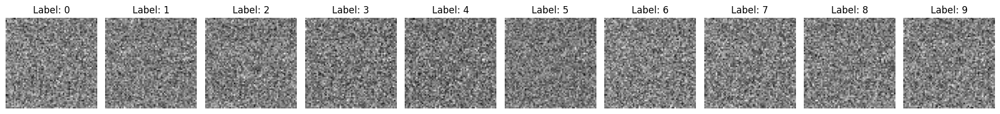

In [37]:
save_fake_labled_images(epoch=0)

Epoch 1, Step 1871, D Loss: 0.2952, G Loss: 2.6463

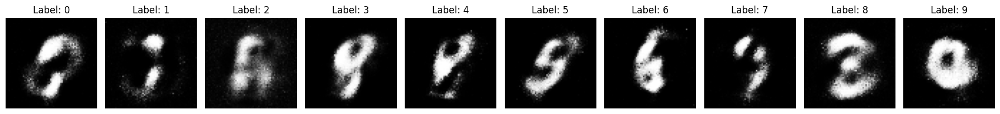

Epoch 2, Step 1871, D Loss: 0.9492, G Loss: 1.4633

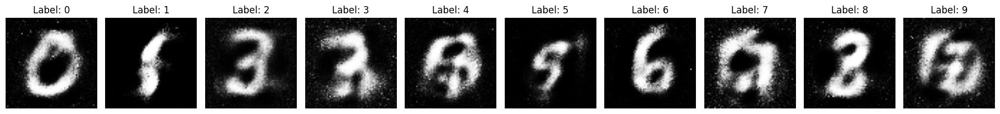

Epoch 3, Step 1871, D Loss: 0.6278, G Loss: 1.5733

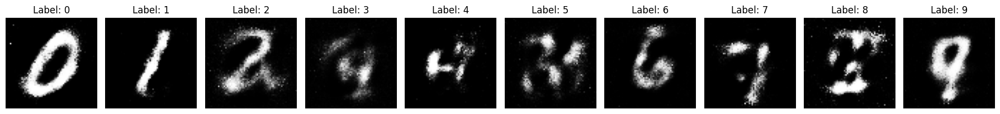

Epoch 4, Step 1871, D Loss: 0.6464, G Loss: 2.6763

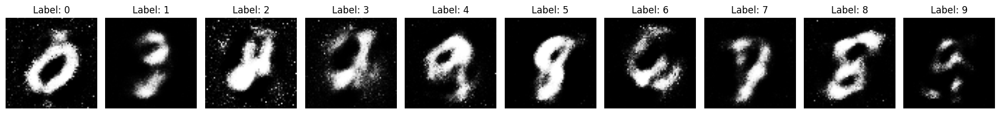

Epoch 5, Step 1871, D Loss: 0.8207, G Loss: 1.5655

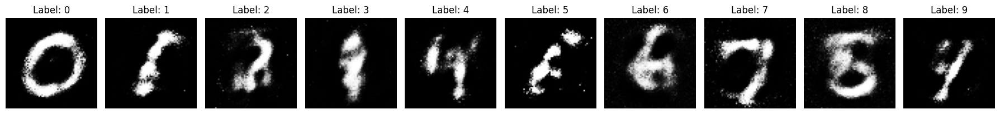

Epoch 6, Step 1871, D Loss: 0.4936, G Loss: 1.7078

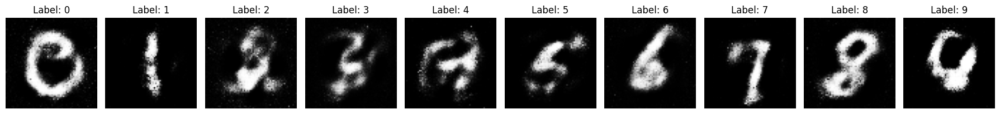

Epoch 7, Step 1871, D Loss: 0.8296, G Loss: 1.9948

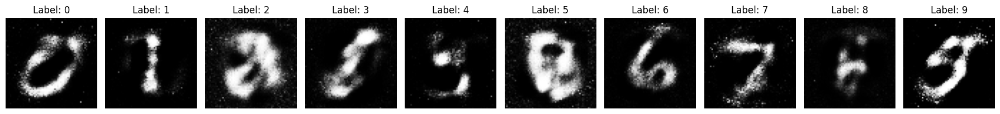

Epoch 8, Step 1871, D Loss: 0.4977, G Loss: 1.5288

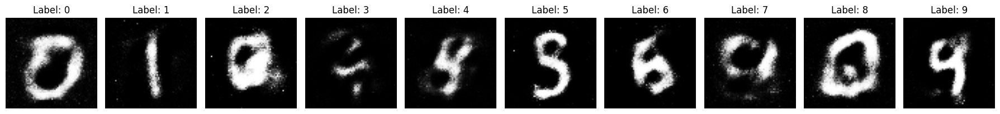

Epoch 9, Step 1871, D Loss: 1.1882, G Loss: 1.4129

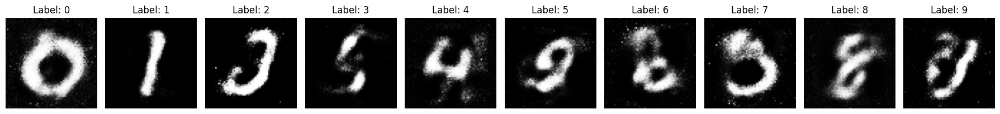

Epoch 10, Step 1871, D Loss: 0.9010, G Loss: 1.8596

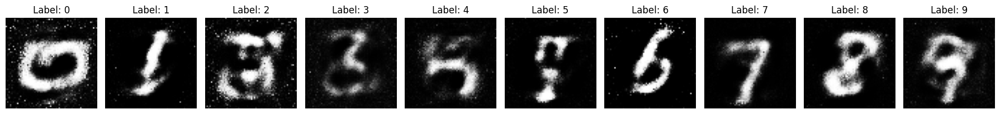

Epoch 11, Step 1871, D Loss: 0.7950, G Loss: 1.4060

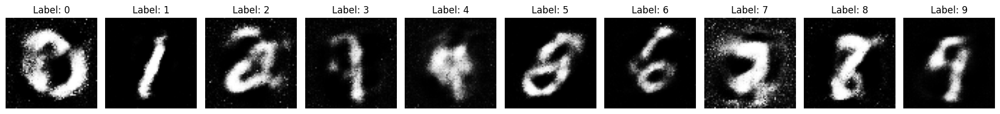

Epoch 12, Step 1871, D Loss: 0.9307, G Loss: 1.2291

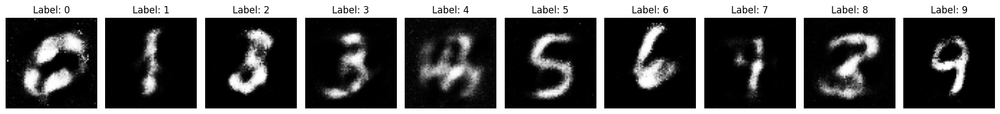

Epoch 13, Step 1871, D Loss: 1.1374, G Loss: 1.1919

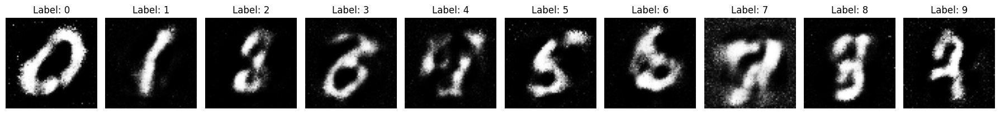

Epoch 14, Step 1871, D Loss: 1.5097, G Loss: 1.1080

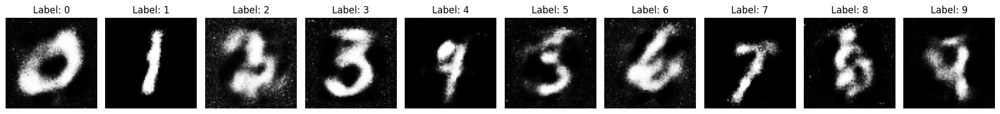

Epoch 15, Step 1871, D Loss: 1.0070, G Loss: 1.5204

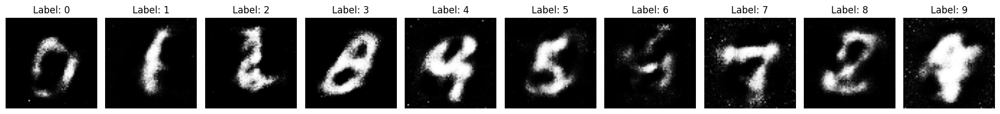

Epoch 16, Step 1871, D Loss: 1.6664, G Loss: 2.3399

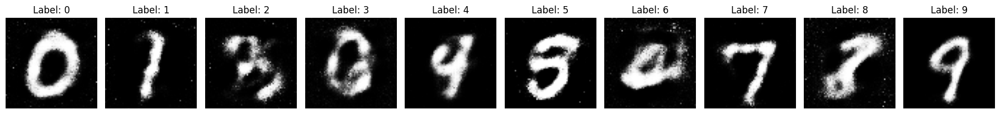

Epoch 17, Step 1871, D Loss: 1.1745, G Loss: 0.8427

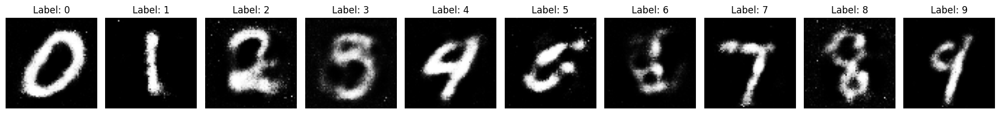

Epoch 18, Step 1871, D Loss: 1.2107, G Loss: 1.0725

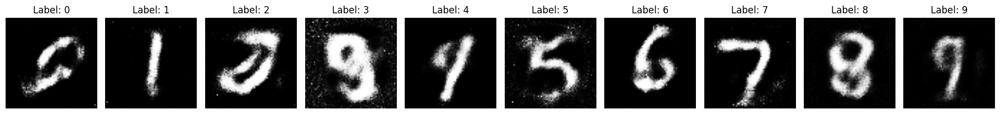

Epoch 19, Step 1871, D Loss: 1.0704, G Loss: 1.0083

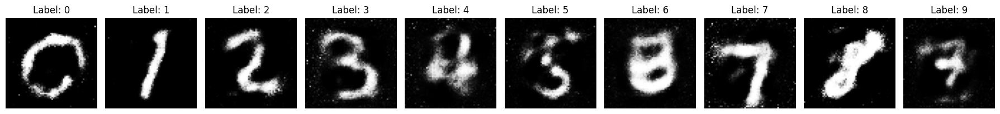

Epoch 20, Step 1871, D Loss: 1.0829, G Loss: 1.0029

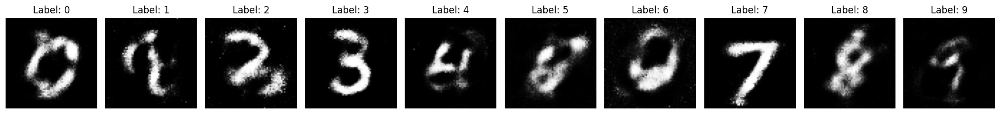

Epoch 21, Step 1871, D Loss: 1.2652, G Loss: 1.1586

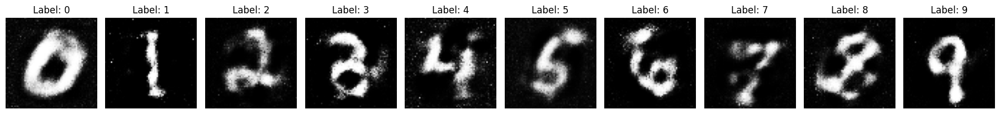

Epoch 22, Step 1871, D Loss: 1.0086, G Loss: 1.3754

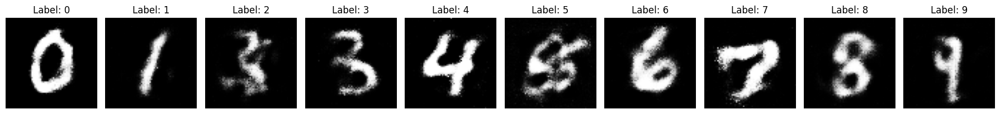

Epoch 23, Step 1871, D Loss: 1.0918, G Loss: 1.3393

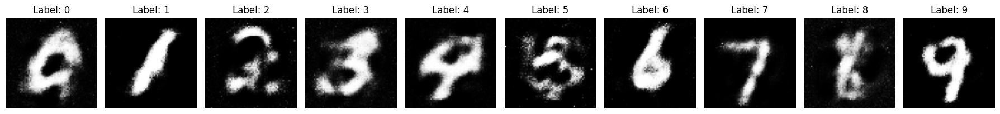

Epoch 24, Step 1871, D Loss: 1.3075, G Loss: 0.9799

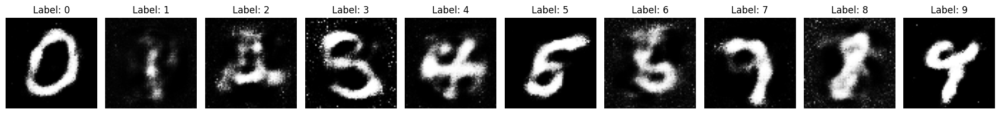

Epoch 25, Step 1871, D Loss: 1.0233, G Loss: 0.9410

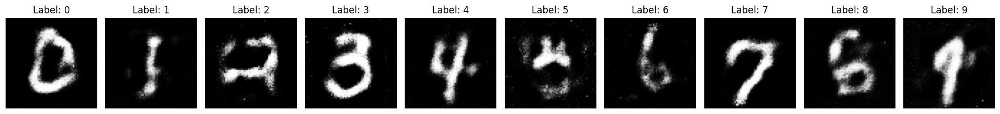

Epoch 26, Step 1871, D Loss: 1.0737, G Loss: 1.1146

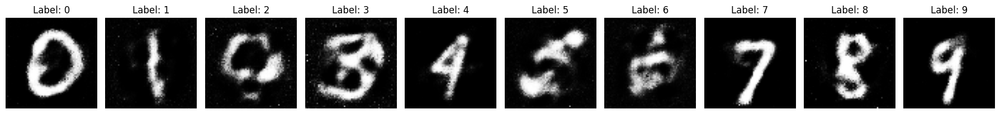

Epoch 27, Step 1871, D Loss: 1.0116, G Loss: 1.2480

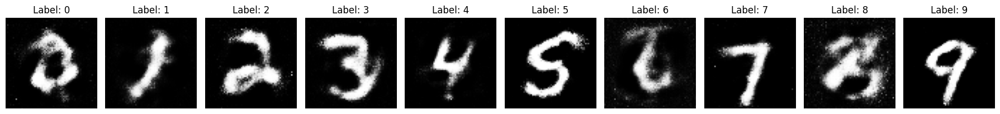

Epoch 28, Step 1871, D Loss: 1.2057, G Loss: 1.0322

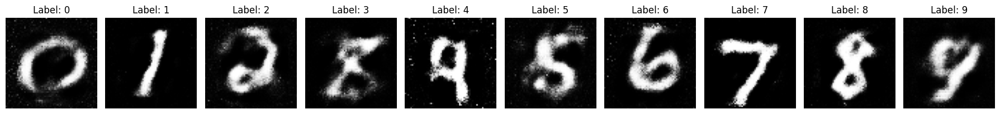

Epoch 29, Step 1871, D Loss: 1.2165, G Loss: 0.8554

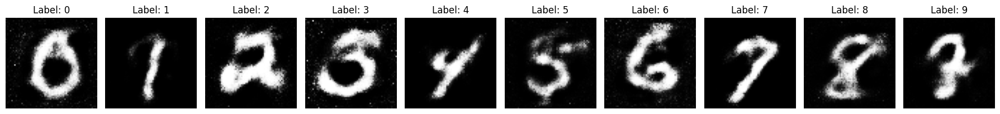

Epoch 30, Step 1871, D Loss: 1.1253, G Loss: 0.9830

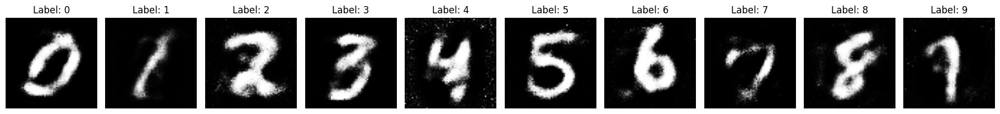

Epoch 31, Step 1871, D Loss: 1.0546, G Loss: 1.1359

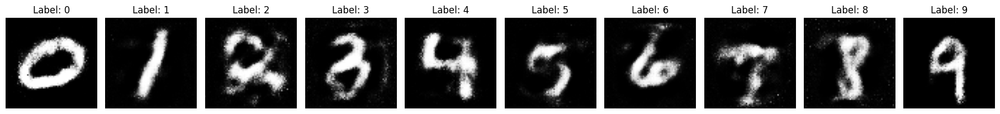

Epoch 32, Step 1871, D Loss: 1.1719, G Loss: 1.1186

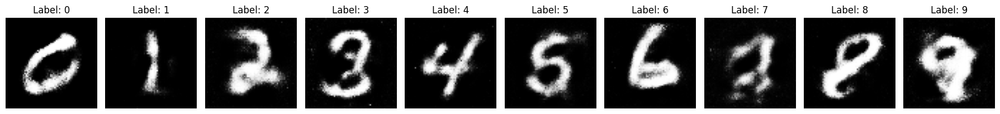

Epoch 33, Step 1871, D Loss: 1.0361, G Loss: 1.4512

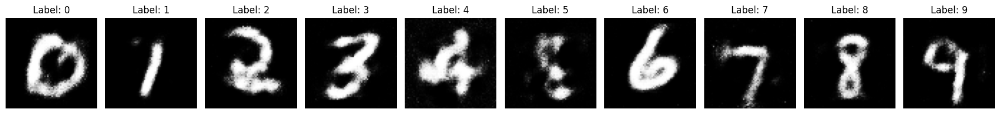

Epoch 34, Step 1871, D Loss: 1.2952, G Loss: 1.0447

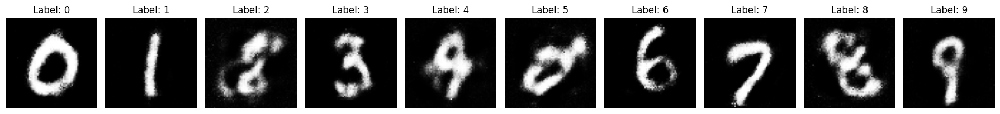

Epoch 35, Step 1871, D Loss: 1.1233, G Loss: 1.2508

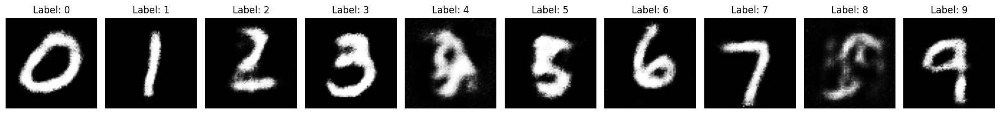

Epoch 36, Step 1871, D Loss: 1.0387, G Loss: 1.3022

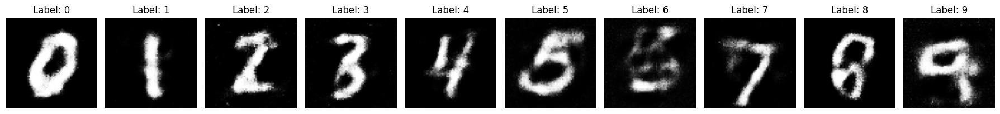

Epoch 37, Step 1871, D Loss: 1.1328, G Loss: 1.7082

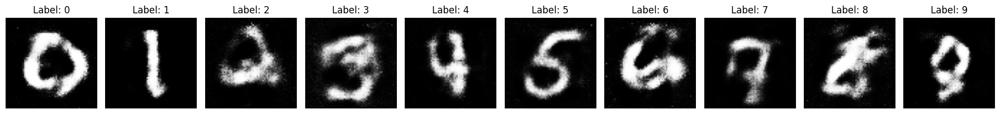

Epoch 38, Step 1871, D Loss: 1.3025, G Loss: 0.7649

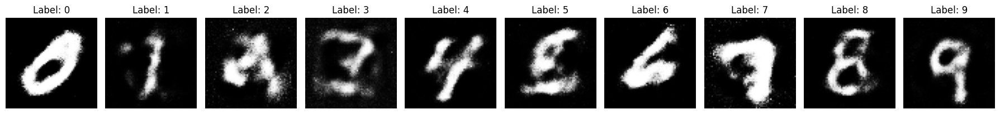

Epoch 39, Step 1871, D Loss: 1.3372, G Loss: 0.8377

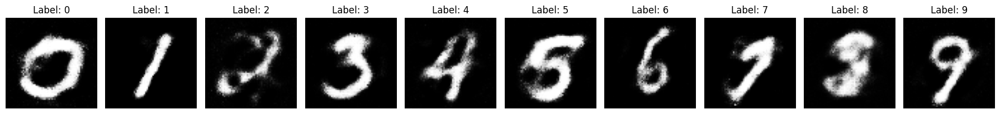

Epoch 40, Step 1871, D Loss: 1.0778, G Loss: 1.3185

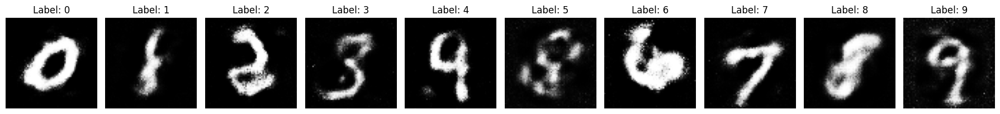

Epoch 41, Step 1871, D Loss: 1.3136, G Loss: 0.7999

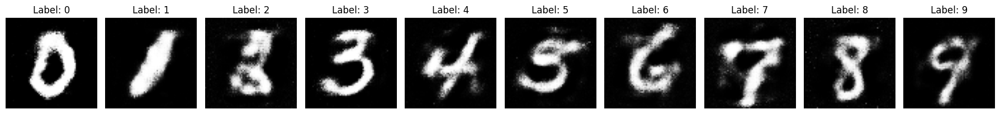

Epoch 42, Step 1871, D Loss: 1.1810, G Loss: 1.1201

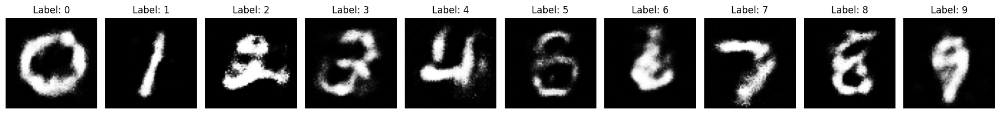

Epoch 43, Step 1871, D Loss: 1.1787, G Loss: 0.9877

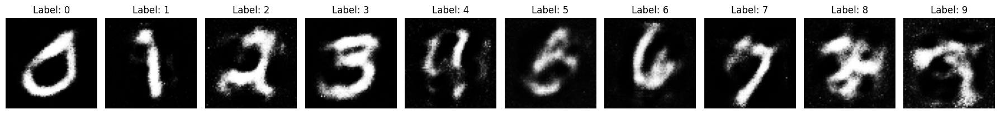

Epoch 44, Step 1871, D Loss: 1.3848, G Loss: 0.9066

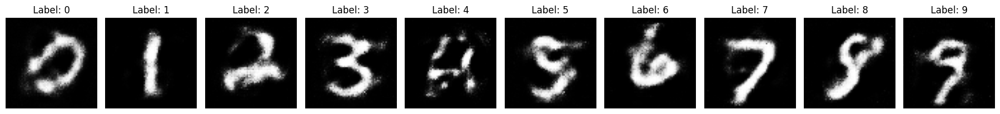

Epoch 45, Step 1871, D Loss: 1.1992, G Loss: 1.0085

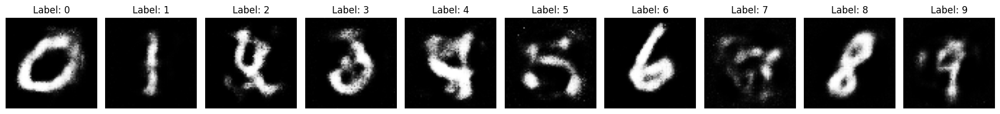

Epoch 46, Step 1871, D Loss: 1.3872, G Loss: 0.8587

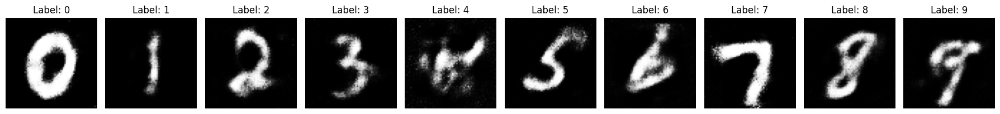

Epoch 47, Step 1871, D Loss: 1.0255, G Loss: 1.2992

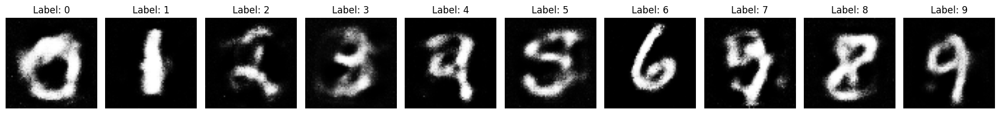

Epoch 48, Step 1871, D Loss: 1.1853, G Loss: 1.3169

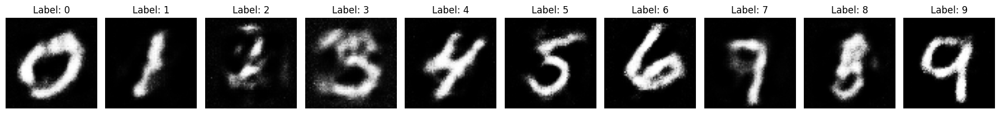

Epoch 49, Step 1871, D Loss: 1.1661, G Loss: 1.4788

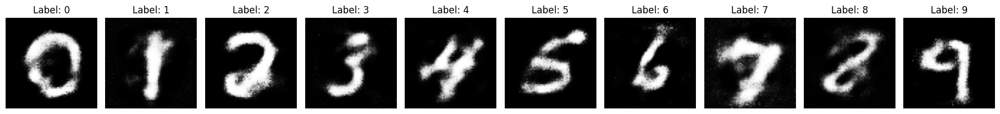

Epoch 50, Step 1871, D Loss: 1.2478, G Loss: 0.9097

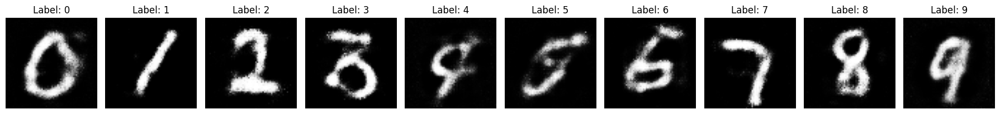

In [39]:
num_epochs = 50 #change it if you need
z_dim = 100

# Labels for generated images
sample_labels = torch.randint(0, 10, (32,)).type(torch.LongTensor).cuda()

for epoch in range(num_epochs):
    for i, (imgs, labels) in enumerate(data_loader):

        batch_size = imgs.shape[0]

        # Adversarial ground truths
        valid = torch.ones(batch_size, 1).cuda()
        fake = torch.zeros(batch_size, 1).cuda()

        # Train Generator
        optimizer_G.zero_grad()

        # Hint: Sample noise and labels. Generate a batch of images and calculate and backpropagate g_loss
        # Your code here [10 score]
        z = torch.randn(batch_size, z_dim).cuda()
        gen_labels = torch.randint(0, 10, (batch_size,)).cuda()
        gen_imgs = generator(z, gen_labels)
        validity = discriminator(gen_imgs, gen_labels)
        g_loss = adversarial_loss(validity, valid)
        g_loss.backward()
        optimizer_G.step()

        # Train Discriminator
        optimizer_D.zero_grad()

        # Hint: Pass real and fake images to discriminator and backporpagate sum of real and fake losses
        # Your code here [10 score]
        real_pred = discriminator(imgs.cuda(), labels.cuda())
        d_real_loss = adversarial_loss(real_pred, valid)
        fake_pred = discriminator(gen_imgs.detach(), gen_labels)
        d_fake_loss = adversarial_loss(fake_pred, fake)
        d_loss = d_real_loss + d_fake_loss
        d_loss.backward()
        optimizer_D.step()



        # Save training progress
        if i % 10 == 0:
            print(f'\rEpoch {epoch+1}, Step {i+1}, D Loss: {d_loss:.4f}, G Loss: {g_loss:.4f}', end='')

    save_fake_labled_images(epoch)

**Question:** [10 score]

With learned insights from the notebook, compare Conditional Generative Adversarial Networks (CGANs) and traditional Generative Adversarial Networks (GANs) in terms of architecture, input data, loss functions, and potential applications.

```
Architecture:

GANs: The architecture of a GAN consists of two neural networks, the generator and the discriminator1. The generator creates fake data (often images) that look as real as possible, aiming to trick the discriminator. The discriminator’s job is to determine which images are real (from a database/sample) and which are fake (made by the generator).
CGANs: CGANs are a variant of GANs where the data generation by the generator is conditioned on certain information. This information can be fed to both the generator and discriminator.

Input Data:

GANs: GANs are considered an unsupervised learning method because they can learn from unlabeled data. However, during the training process, labels are used internally to guide the learning of the discriminator.
CGANs: In CGANs, the image generation can be conditional on a class label, if available. This allows the targeted generation of images of a given type.
Loss Functions:

GANs: The loss function in GANs involves a zero-sum game between the generator and the discriminator. Improvements in the discriminator come at the cost of a reduced capability of the generator, and vice versa.
CGANs: The loss function in CGANs is similar to that in GANs, but it also takes into account the conditioning variables.
Potential Applications:

GANs: GANs are effective at image synthesis, i.e., generating new examples of images for a target dataset.
CGANs: CGANs are unlocking a variety of innovative applications in the realm of artificial intelligence. They can generate specific data tailored to business needs, and allow the targeted generation of items of clothing.
```

